# Notebook pour OCR

Ce notebook a comme bout d'expérimenter diverses approches pour l'OCR.

Le dataset consiste des images (un total de 20) contenant les nombres de la lécture des compteurs d'eau, obtenues d'après le modèle précedent (en utilisant YOLOv5s).

Malgré contraire la méthodologie usuel adopté par l'auteur (celle où l'analyse exploratoire des données se fait d'êxtreme importance et occupe la priorité des pas suivis lors de quelque analyse de machine learning), nous avons choisit d'essayer divers types de traitement d'images (rémotion de bruit, binarization, correction d'angle, inversion), en croyant que celui-ci se faisait le chemin le plus adopté dans la communauté pour avoir des résultats satisfaisantes lors de l'OCR.

Toutefois, due aux résultats pas satisfaisants obtenus avec ce traitement précedent, l'adoption de ***réduire la dimensionalité*** des données en utilisant PCA, se fait dernièrement.

**Méthodologie**

Divers types de pipelines de traitement ont été adoptés pour voir les différences de résultat de la chaîne de plusieurs transformations.

Les objectifs, étant à la fois de séparer les chiffres du background comme forme d'évidencier l'objet principale en question et de transformer l'image en sorte de la charactérizer différement pour l'OCR, s'avèrent comme ayant des difficulté accentués. 

Pour mieux connaître ces traitements individuelement, des essais pour chaque transformation ont été réalisés et se trouvent sous la partie *Appendice*. 


# Conclusion & travails futurs

La tâche de reconnaître le nombre d'um compteur s'est montrée comme un défi motivant. Malgré une faible performance des approches ici abordées, nous sommes confiants qu'une investigation plus approfondie à la fois sur plan des transformation d'image (et ses paramètres) et sur les types de modèles d'OCR aboutiront à des résultats satisfaisants.

Les transformations de **DISTANCE** et de **SEPARATION DES CONTOURS** se montrent comme prommeteuses et feraient sûrement partie de la progression de ce travail.

Finalement, la **réduction de dimensionalité linéaire** s'est également montrée comme d'importance non négligeable, portant des résultats notable sur l'OCR par rapport les images originales. 

Au-delà de ces observations, l'étude (et éventuel entraînement) des architectures CRNN spécifiquement pour la reconnaissance de chiffres de compteurs pourrait mener à des résultats plus satisfaisantes.





In [ ]:
import os
!pip install paddlepaddle-gpu
!pip install "paddleocr>=2.0.1"

import os
import glob
import random
import time
import cv2
import numpy as np
import subprocess
import sys
from PIL import Image
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
from paddleocr import PaddleOCR

In [1]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import shutil
import os
try:
  shutil.rmtree("/content/meter")
except:
  pass

try:
  shutil.rmtree("/content/datasets/")
except:
  pass  

os.mkdir("/content/meter")

In [ ]:
!unzip "/content/drive/MyDrive/meter/meters.v4i.yolov5pytorch.zip" -d /content/meter/

In [4]:
from pathlib import Path
def create_data_directories(data_name):
    Path(f"../datasets/{data_name}/images/train").mkdir(parents=True, exist_ok=True)
    Path(f"../datasets/{data_name}/images/valid").mkdir(parents=True, exist_ok=True)
    Path(f"../datasets/{data_name}/images/test").mkdir(parents=True, exist_ok=True)
    Path(f"../datasets/{data_name}/labels/train").mkdir(parents=True, exist_ok=True)
    Path(f"../datasets/{data_name}/labels/valid").mkdir(parents=True, exist_ok=True)
    Path(f"../datasets/{data_name}/labels/test").mkdir(parents=True, exist_ok=True)

    
create_data_directories('meter')

In [ ]:
!mv /content/meter/valid/labels/* /content/datasets/meter/labels/valid/
!mv /content/meter/train/labels/* /content/datasets/meter/labels/train/
!mv /content/meter/test/labels/* /content/datasets/meter/labels/test/

!mv /content/meter/valid/images/* /content/datasets/meter/images/valid/
!mv /content/meter/train/images/* /content/datasets/meter/images/train/
!mv /content/meter/test/images/* /content/datasets/meter/images/test/

In [ ]:
# !unzip "/content/drive/MyDrive/meter/yolov_v1.zip" -d /content/
# !unzip "/content/drive/MyDrive/meter/yolov_v2_evolve2.zip" -d /content/yolov_v1_evolve2
# !unzip "/content/drive/MyDrive/meter/yolov_v1_validation.zip" -d /content/yolov_v1_validation
!unzip "/content/drive/MyDrive/meter/yolov_v1_detect_test.zip" -d /content/yolov_v1_detect_test
!unzip "/content/drive/MyDrive/meter/yolov_v1_detect_test3_cropped.zip" -d /content/yolov_v1_detect_test_cropped

# Image Pre-processing

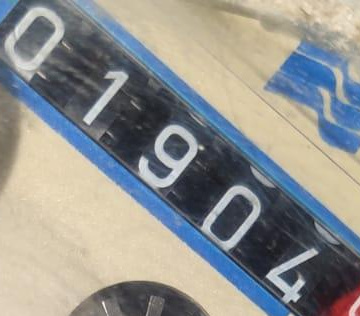

In [7]:
import cv2
from google.colab.patches import cv2_imshow
# example image:
img_dir = "/content/yolov_v1_detect_test_cropped/content/yolov5/runs_meter/detect_test2/crops/meter/abokgn_jpg.rf.838ab0a80b444fb0b436d02f72bee4f0.jpg"

img = cv2.imread(img_dir)
cv2_imshow(img)

Ici nous pouvons faire toutes les combinations possibles de ces 3 traitements.

pipelines (l'ordre de transformations):

1)

*   binarization
*   noise removal
*   thinning

2) 

*   noise removal
*   binarization
*   thinning

3)

*   noise removal
*   thinning
*   binarization

4) 

*   thinning
*   binarization
*   noise removal

5) 

*   binarization
*   thinning
*   noise removal



(OBS: les codes pour chacune de ces transformations se trouvent dans le script *image_processing.py*)

In [ ]:
!cp /content/drive/MyDrive/meter/image_processing.py /content/

from image_processing import *

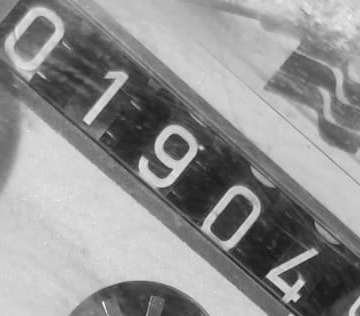

(0, 1, 2)
Binarized


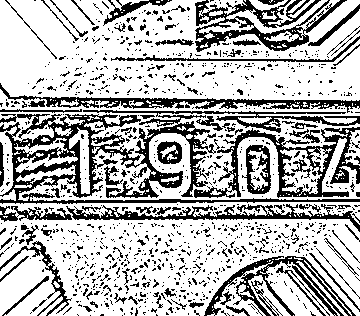

Right  : Thinning


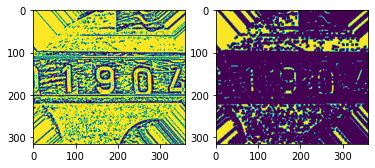

Right : Noise removed


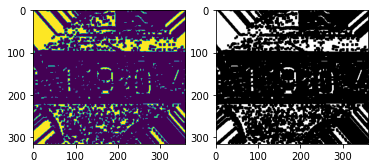

(0, 2, 1)
Binarized


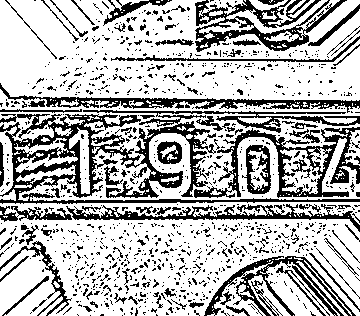

Right : Noise removed


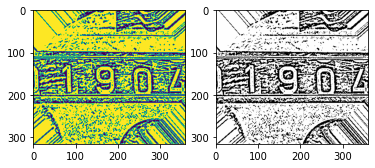

Right  : Thinning


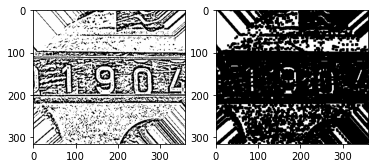

(1, 0, 2)
Right  : Thinning


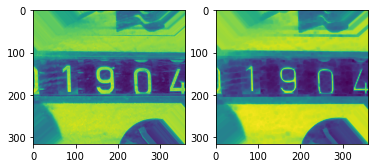

Binarized


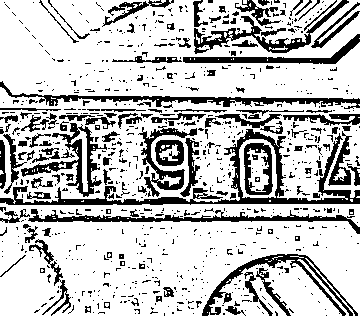

Right : Noise removed


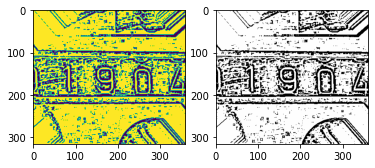

(1, 2, 0)
Right  : Thinning


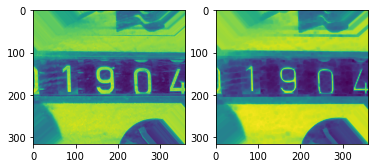

Right : Noise removed


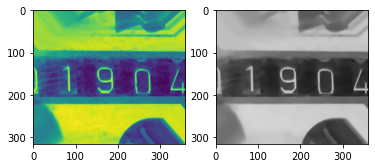

Binarized


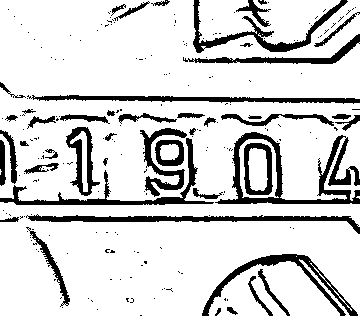

(2, 0, 1)
Right : Noise removed


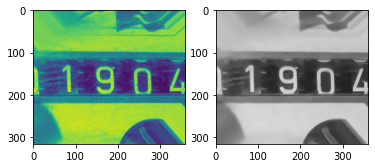

Binarized


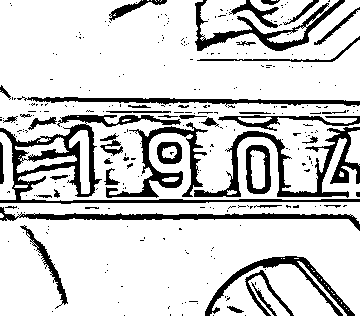

Right  : Thinning


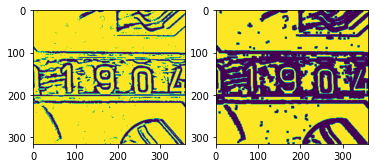

(2, 1, 0)
Right : Noise removed


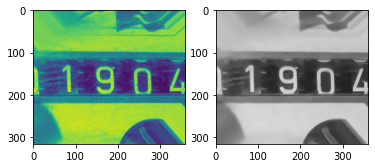

Right  : Thinning


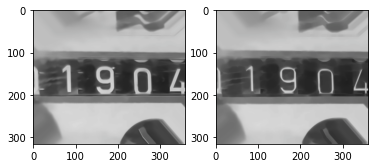

Binarized


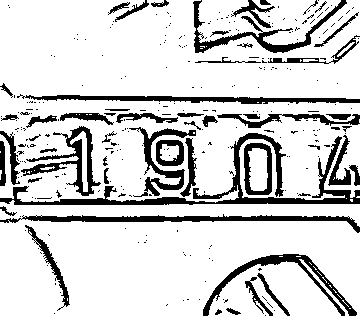

In [15]:
from itertools import permutations
img_dir = "/content/yolov_v1_detect_test_cropped/content/yolov5/runs_meter/detect_test2/crops/meter/abokgn_jpg.rf.838ab0a80b444fb0b436d02f72bee4f0.jpg"

img = cv2.imread(img_dir)
# Get all permutations of [1, 2, 3]
bag = {0:"binarize", 1:"thinning",2: "noise_removal"}
perm = permutations([0,1,2])
gray = to_gray(img)
angle,skewed = correct_skew(gray)

for step in perm:
  print(step)
  current_img = skewed
  for each in step:
    if each == 0:
      current_img = binarize(current_img)
    elif each == 1:
      current_img = thinning(current_img)
    else:
      current_img = noise_removal(current_img)



D'une perspective du "propre", les pipelines
- Noise removal -> thinning -> binarized
- Thinning -> Noise removal -> binarized

semblent être les plus intéressantes à travailler avec.


Le but étant de laisser seulement les chiffres sur l'image, d'autres traitement se font nécessaires.

# établissons comme pipeline les transformations suivantes:

1) correction d'angle

2) séléction des pixels noires

3) inversion binaire

Référence: https://pyimagesearch.com/2021/11/22/improving-ocr-results-with-basic-image-processing/

In [ ]:
os.mkdir("/content/ocr_test/")

In [ ]:
def pipeline(image_dir, out_dir):
  try:
    img = cv2.imread(image_dir)
  except:
    img = image_dir # case where 'imgae_dir' is actually the array image

  hh, ww = img.shape[:2]
  lower = np.array([200])
  upper = np.array([255])

  a, skewed_img = correct_skew(img.copy())
  # threshold image
  thresholded_img = cv2.inRange(skewed_img.copy(), lower, upper)
  test_img(thresholded_img.copy(),None,None,out_dir)
  # binary threshold
  bin_thresh = cv2.threshold(thresholded_img.copy(), 0, 255,
	cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
  oc, res = test_img(thresholded_img.copy(),None,None,out_dir)
  print("OCR result : ",oc, "\n" )


In [ ]:
font = cv2.FONT_HERSHEY_SIMPLEX
blue_color = (255,0,0)
white_color = (255,255,255)
black_color = (0,0,0)
green_color = (0,255,0)
yellow_color = (178, 247, 218)

# import cv2
# reference : https://learnopencv.com/automatic-license-plate-recognition-using-deep-learning

def crop(image, coord):
  # Cropping is done by -> image[y1:y2, x1:x2].
  cr_img = image[int(coord[1]):int(coord[3]), int(coord[0]):int(coord[2])]
  return cr_img


def test_img(croped, config_file, weights, out_path):

  input = croped
  try:
    img = cv2.imread(croped)
  except:
    img = input

  # applying the OCR.
  result = ocr.ocr(img,cls=False, det=False)
  # print("result : ", result)
  ocr_res = result[0][0]
  rec_conf = result[0][1]
  # print("ocr result : ", ocr_res)
  if ocr_res == '':
    ocr_res = "None"

  height, width = img.shape[:2]

  org = tuple((0,height))
  cv2.rectangle(img, (int(0), int(0)), (width, height), blue_color, 2)
  cv2.rectangle(img, (0,0), (0,0), blue_color,-1)
  cv2.putText(img, ocr_res, org, font, 2, green_color,3)
  # Writing output image.
  if type(input) is np.ndarray:
    file_name = os.path.join(out_path, 'out_' + ocr_res + ".jpg")
  else:
    file_name = os.path.join(out_path, 'out_' + input.split('/')[-1])

  cv2.imwrite(file_name, img)
  return ocr_res, result

ocr = PaddleOCR(lang='en',rec_algorithm='SVTR_LCNet')

download https://paddleocr.bj.bcebos.com/PP-OCRv3/english/en_PP-OCRv3_det_infer.tar to /root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer/en_PP-OCRv3_det_infer.tar


100%|██████████| 3.86M/3.86M [00:13<00:00, 293kiB/s]


download https://paddleocr.bj.bcebos.com/PP-OCRv3/english/en_PP-OCRv3_rec_infer.tar to /root/.paddleocr/whl/rec/en/en_PP-OCRv3_rec_infer/en_PP-OCRv3_rec_infer.tar


100%|██████████| 9.96M/9.96M [00:15<00:00, 626kiB/s] 


download https://paddleocr.bj.bcebos.com/dygraph_v2.0/ch/ch_ppocr_mobile_v2.0_cls_infer.tar to /root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer/ch_ppocr_mobile_v2.0_cls_infer.tar


100%|██████████| 1.45M/1.45M [00:08<00:00, 176kiB/s]

[2022/07/08 12:35:02] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_fce_box_type='poly', det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_box_type='quad', det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_polygon=False, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='f

Essayong maitenant le PaddleOCR avec ces images traitées.

In [ ]:
folder_dir = "/content/yolov_v1_detect_test_cropped/content/yolov5/runs_meter/detect_test2/crops/meter"
for each in os.listdir(folder_dir):
  pipeline(os.path.join(folder_dir,each), "/content/ocr_test/")

OCR result :  : 

OCR result :  None 

OCR result :  h 

OCR result :  None 

OCR result :  None 

OCR result :  F 

OCR result :  497H 

OCR result :  0 

OCR result :  : 

OCR result :  E 

OCR result :  None 

OCR result :  None 

OCR result :  : 

OCR result :  None 

OCR result :  None 

OCR result :  None 

OCR result :  E 

OCR result :  E 

OCR result :  None 

OCR result :  None 

OCR result :  None 



évidement, les traitments d'image choisis n'ont pas aidé l'OCR. 

# PCA comme processement d'image

In [ ]:
folder_dir

'/content/yolov_v1_detect_test_cropped/content/yolov5/runs_meter/detect_test2/crops/meter'

Minimum Number of components explaining 95% variance of ALL images in dataset: 19


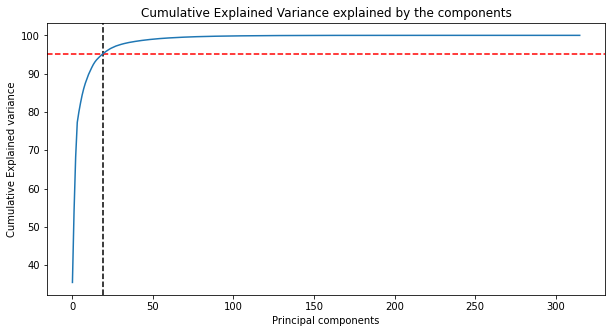

In [ ]:
from sklearn.decomposition import PCA, IncrementalPCA, KernelPCA

# pca = PCA()
all_k = []
for each in os.listdir(folder_dir):

  read_img = cv2.imread(os.path.join(folder_dir, each))
  gray_img = cv2.cvtColor(read_img, cv2.COLOR_BGR2GRAY)
  pca = PCA(random_state = 10)
  pca.fit(gray)

  # Getting the cumulative variance
  var_cumu = np.cumsum(pca.explained_variance_ratio_)*100
  # How many PCs explain 95% of the variance?
  k = np.argmax(var_cumu>95)
  # print("Number of components explaining 95% variance: "+ str(k))
  all_k.append(k)
#print("\n")
print("Minimum Number of components explaining 95% variance of ALL images in dataset: "+ str(max(all_k)))
plt.figure(figsize=[10,5])
plt.title('Cumulative Explained Variance explained by the components')
plt.ylabel('Cumulative Explained variance')
plt.xlabel('Principal components')
plt.axvline(x=k, color="k", linestyle="--")
plt.axhline(y=95, color="r", linestyle="--")
ax = plt.plot(var_cumu)

Example pour la première image

Text(0.5, 1.0, 'PCA')

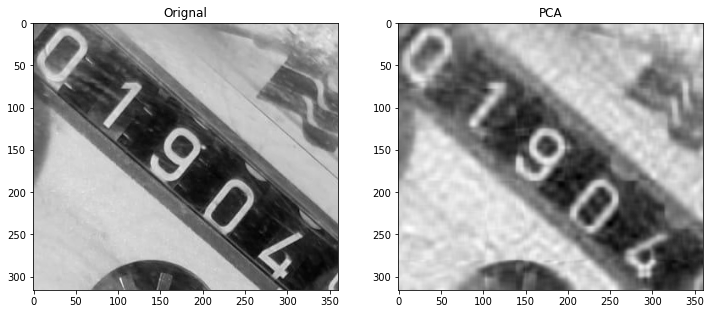

In [ ]:
nc = max(all_k)
def make_pca(image,nc):
  if type(image) is np.ndarray:
    if len(image.shape) == 3:
      gray_image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    else:
      gray_image = image
  # print("type gray : ", type(gray_image))
  # ipca = IncrementalPCA(n_components=nc)
  ipca = IncrementalPCA(n_components=nc)
  image_recon = ipca.inverse_transform(ipca.fit_transform(gray_image))
  image_recon = image_recon.astype(np.uint8)
  # print("type  : ", type(image_recon))
  return image_recon

image_recon = make_pca(img,nc)
# Plotting the reconstructed image
plt.figure(figsize=[12,8])
plt.subplot(121)
plt.imshow(gray,cmap = plt.cm.gray)
plt.title("Orignal")
plt.subplot(122)
plt.imshow(image_recon,cmap = plt.cm.gray)
plt.title("PCA")

établissons maintenant une nouvelle pipeline:

1.  Grayscale
2.  correction d'angle
3.  PCA lineair
4.  Threshold (retenir noir: le chiffre en blanc ou noir)
5.  Inversion binaire (l'inverse de Threshold)

In [ ]:
os.mkdir("/content/pca/")

In [ ]:
def pca_pipeline(image_dir, out_dir):
  try:
    img = cv2.imread(image_dir)
  except:
    img = image_dir # case where 'imgae_dir' is actually the array image
  plt.figure(figsize=(20,20))

  hh, ww = img.shape[:2]
  lower = np.array([150])
  upper = np.array([255])

  a, skewed_img = correct_skew(img.copy())

  pca_im = make_pca(skewed_img.copy(),nc)
  ocr, res = test_img(pca_im.copy(),None,None,out_dir)
  print("OCR result with GRAY-PCA transformation : ", ocr)

  # threshold image
  thresholded_img = cv2.inRange(pca_im.copy(), lower, upper)
  ocr, res = test_img(thresholded_img.copy(),None,None,out_dir)
  print("OCR result with GRAY-PCA-THRESHOLD transformation : ", ocr)

  # binary threshold
  bin_thresh = cv2.threshold(thresholded_img.copy(), 0, 255,
	cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
  ocr, res = test_img(bin_thresh.copy(),None,None,out_dir)
  print("OCR result with GRAY-PCA-THRESHOLD-BIN transformation : ", ocr)

  cv2_imshow(cv2.hconcat([img, skewed_img,pca_im,thresholded_img,bin_thresh]))
  print("\n\n")

In [ ]:
folder_dir

'/content/yolov_v1_detect_test_cropped/content/yolov5/runs_meter/detect_test2/crops/meter'

OCR result with GRAY-PCA transformation :  BOR
OCR result with GRAY-PCA-THRESHOLD transformation :  None
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  None


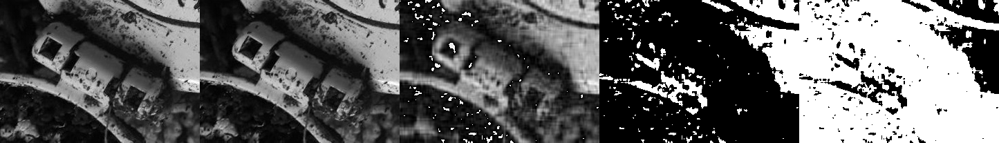




OCR result with GRAY-PCA transformation :  501P
OCR result with GRAY-PCA-THRESHOLD transformation :  501
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  501E


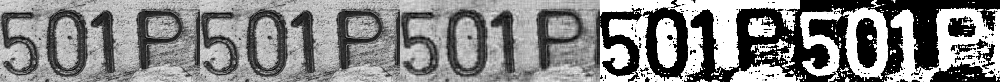




OCR result with GRAY-PCA transformation :  6
OCR result with GRAY-PCA-THRESHOLD transformation :  haEk
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  RR


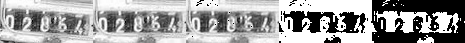




OCR result with GRAY-PCA transformation :  E
OCR result with GRAY-PCA-THRESHOLD transformation :  T
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  1


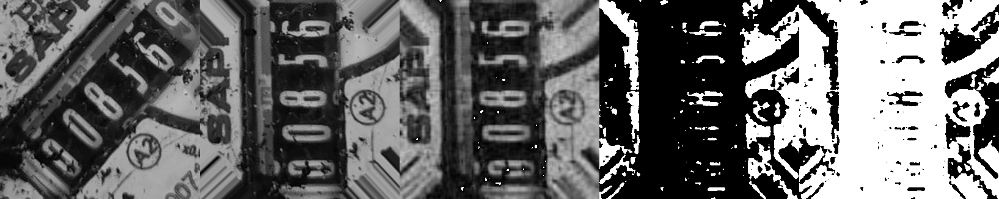




OCR result with GRAY-PCA transformation :  E
OCR result with GRAY-PCA-THRESHOLD transformation :  :
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  :


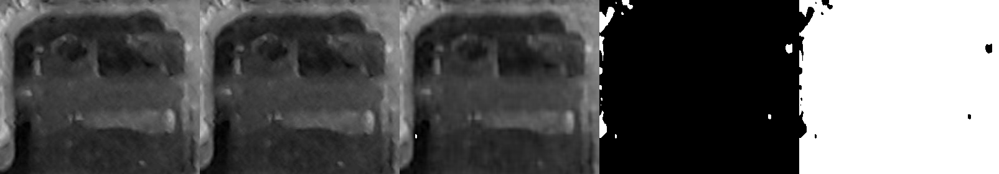




OCR result with GRAY-PCA transformation :  0203
OCR result with GRAY-PCA-THRESHOLD transformation :  003
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  003


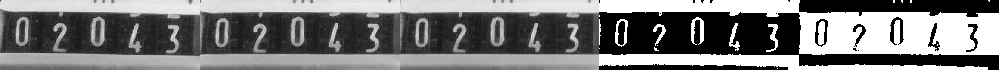




OCR result with GRAY-PCA transformation :  219.312
OCR result with GRAY-PCA-THRESHOLD transformation :  2977
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  23


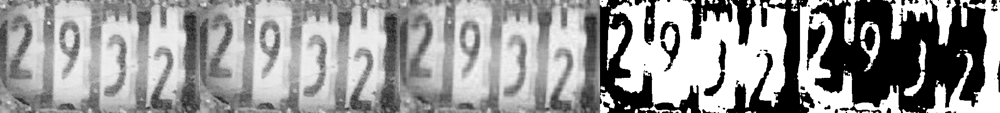




OCR result with GRAY-PCA transformation :  0110158
OCR result with GRAY-PCA-THRESHOLD transformation :  01018
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  DO1


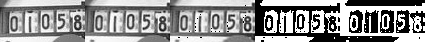




OCR result with GRAY-PCA transformation :  (00946
OCR result with GRAY-PCA-THRESHOLD transformation :  f01 9 G
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  Ho i 9 G


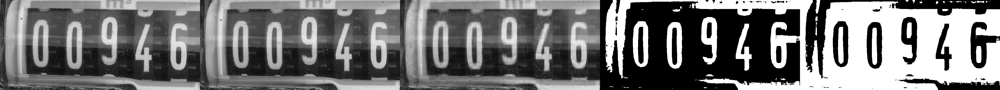




OCR result with GRAY-PCA transformation :  n1210
OCR result with GRAY-PCA-THRESHOLD transformation :  n
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  1.20


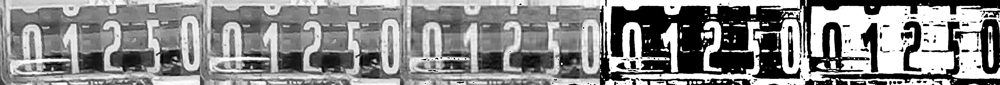




OCR result with GRAY-PCA transformation :  16.0271
OCR result with GRAY-PCA-THRESHOLD transformation :  T
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  F


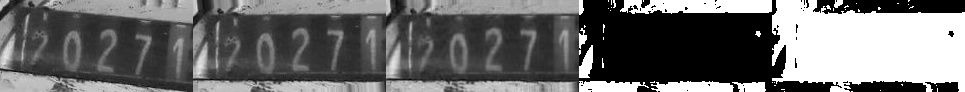




OCR result with GRAY-PCA transformation :  [20
OCR result with GRAY-PCA-THRESHOLD transformation :  Ezr
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  None


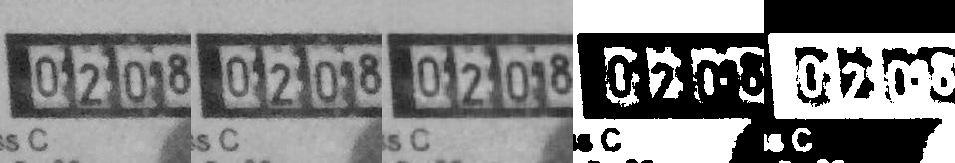




OCR result with GRAY-PCA transformation :  738
OCR result with GRAY-PCA-THRESHOLD transformation :  1t
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  1.


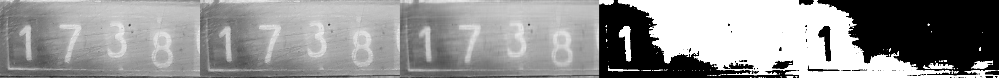




OCR result with GRAY-PCA transformation :  DON
OCR result with GRAY-PCA-THRESHOLD transformation :  None
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  None


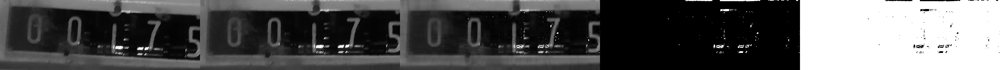




OCR result with GRAY-PCA transformation :  0
OCR result with GRAY-PCA-THRESHOLD transformation :  None
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  None


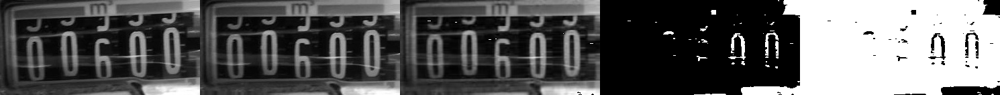




OCR result with GRAY-PCA transformation :  3054
OCR result with GRAY-PCA-THRESHOLD transformation :  i
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  w


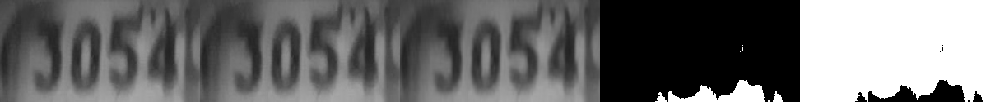




OCR result with GRAY-PCA transformation :  8
OCR result with GRAY-PCA-THRESHOLD transformation :  1
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  None


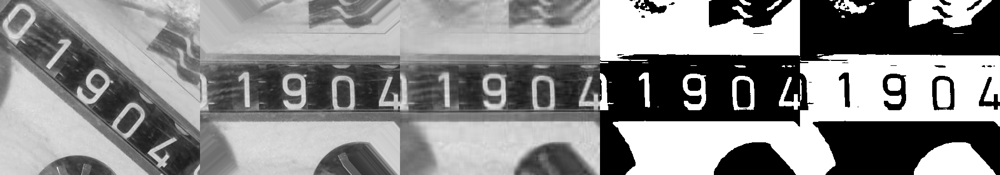




OCR result with GRAY-PCA transformation :  DIHIFIR
OCR result with GRAY-PCA-THRESHOLD transformation :  BoT
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  boi:


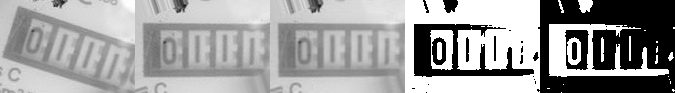




OCR result with GRAY-PCA transformation :  0597
OCR result with GRAY-PCA-THRESHOLD transformation :  15692
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  69


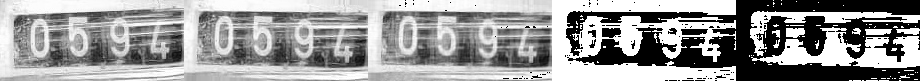




OCR result with GRAY-PCA transformation :  0349
OCR result with GRAY-PCA-THRESHOLD transformation :  39
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  619


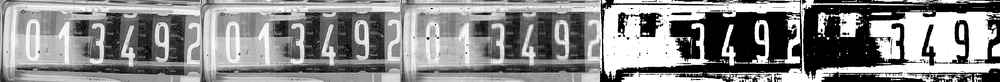




OCR result with GRAY-PCA transformation :  02083
OCR result with GRAY-PCA-THRESHOLD transformation :  07067
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  07m&7


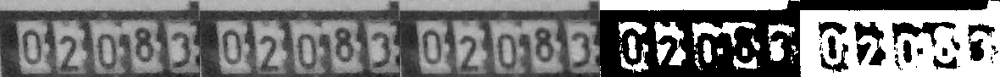

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

In [ ]:
out_dir = "/content/pca/"
for each in os.listdir(folder_dir):
  curr_img = cv2.imread(os.path.join(folder_dir, each))
  gray_img = cv2.cvtColor(curr_img, cv2.COLOR_BGR2GRAY)
  h, w = gray_img.shape[:2]
  if h > w:
    gray_img = cv2.rotate(gray_img, cv2.cv2.ROTATE_90_CLOCKWISE)
  # print("gray shape : ", gray_img.shape, curr_img.shape)
  pca_pipeline(gray_img, out_dir)

Results (total 20 imgaes):

for complete recognition

Only skewed: 3

skewed + PCA: 3

skewed + PCA + THRESHOLD : 0

skewed + PCA + THRESHOLD + INV : 0


For partial recognition (1 to *total - 1* numbers recognized in good order):

Only skewed : 7

skewed + PCA: 8

skewed + PCA + THRESHOLD : 3

skewed + PCA + THRESHOLD + INV : 1

# Non linear reduction

L'approche précedénte part du principe que les rélations existente entre les pixels se fait de façon linéaire. Il se peut cependant que cette rélation est non-linéaire.

Pour cela, on utilise le même processus et la même pipeline, mais cette fois, le PCA aura un kernel non-linéaire. Voyons les résultats sur une image example pour les divers type de kernel.

In [ ]:
def make_nonlinear_pca(image,nc, kernel_type):
  # kernel_type : {‘linear’, ‘poly’, ‘rbf’, ‘sigmoid’, ‘cosine’, ‘precomputed’}
  if type(image) is np.ndarray:
    if len(image.shape) == 3:
      gray_image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    else:
      gray_image = image

  degree = 3
  if kernel_type == "poly":
    degree = 7

  kpca = KernelPCA(n_components=nc, kernel= kernel_type,fit_inverse_transform=True,
                   degree = degree)
  image_recon = kpca.inverse_transform(kpca.fit_transform(gray_image))
  image_recon = image_recon.astype(np.uint8)
  # print("type  : ", type(image_recon))
  return image_recon

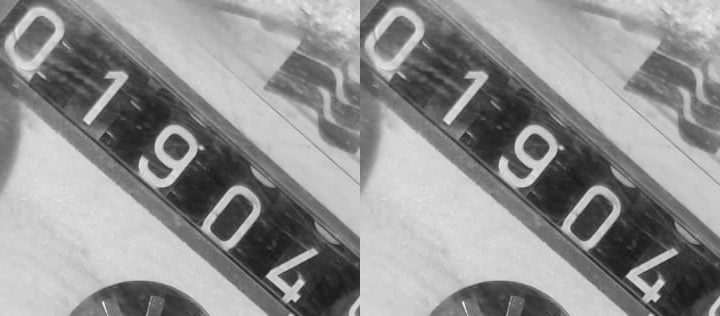

poly PCA


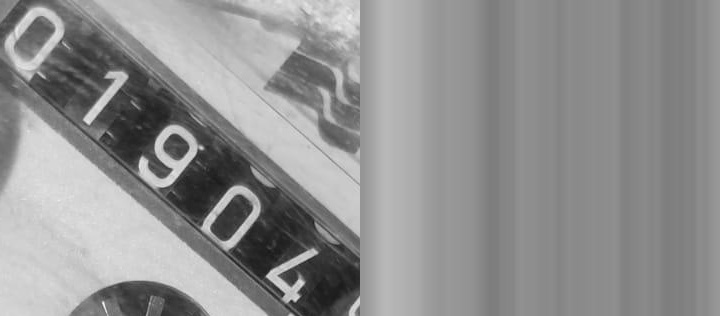

rbf PCA


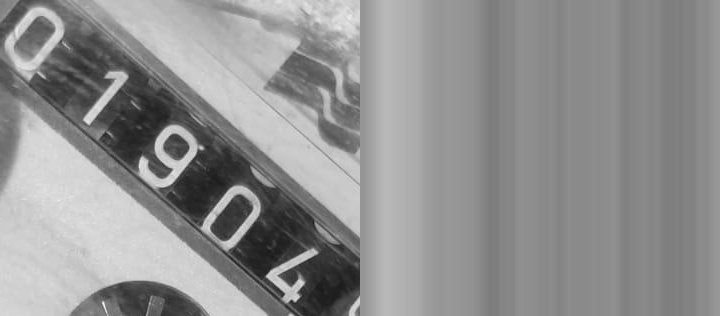

sigmoid PCA


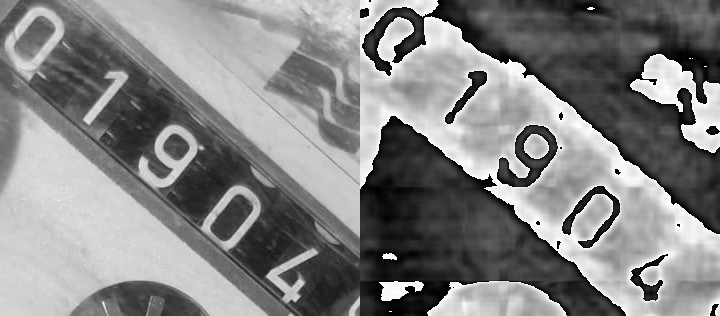

cosine PCA


In [ ]:
kernel_type = ["poly", "rbf", "sigmoid", "cosine"]
for each in kernel_type:
  a = make_nonlinear_pca(gray.copy(), 19, each)
  # print("shape a: ", a.shape)
  cv2_imshow(cv2.hconcat([gray,a]))
  print(f"{each} PCA".format(each))

Les kernel **sigmoid** et **rbf** aboutissent à une transformation inverse que ne nous intéresse pas, alors que **poly** et **cosine** préservent plus la forme originale du contenu.

Prenons **cosine** pour voir comment cette transformation changera l'OCR.

In [ ]:
def nonlinear_pca_pipeline(image_dir, out_dir):
  try:
    img = cv2.imread(image_dir)
  except:
    img = image_dir # case where 'imgae_dir' is actually the array image
  plt.figure(figsize=(20,20))

  hh, ww = img.shape[:2]
  lower = np.array([150])
  upper = np.array([255])

  a, skewed_img = correct_skew(img.copy())
  ocr, res = test_img(skewed_img.copy(),None,None,out_dir)
  print("OCR result with GRAY transformation : ", ocr)

  pca_im = make_nonlinear_pca(skewed_img.copy(),nc, "cosine")
  ocr, res = test_img(pca_im.copy(),None,None,out_dir)
  print("OCR result with GRAY-PCA transformation : ", ocr)

  # threshold image

  thresholded_img = cv2.inRange(pca_im.copy(), lower, upper)
  ocr, res = test_img(thresholded_img.copy(),None,None,out_dir)
  print("OCR result with GRAY-PCA-THRESHOLD transformation : ", ocr)

  # binary threshold
  bin_thresh = cv2.threshold(thresholded_img.copy(), 0, 255,
	cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
  ocr, res = test_img(bin_thresh.copy(),None,None,out_dir)
  print("OCR result with GRAY-PCA-THRESHOLD-BIN transformation : ", ocr)

  cv2_imshow(cv2.hconcat([img, skewed_img,pca_im,thresholded_img,bin_thresh]))
  print("\n\n")

In [ ]:
os.mkdir("/content/non_linear_pca/")

OCR result with GRAY transformation :  ORTIE
OCR result with GRAY-PCA transformation :  None
OCR result with GRAY-PCA-THRESHOLD transformation :  O
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  None


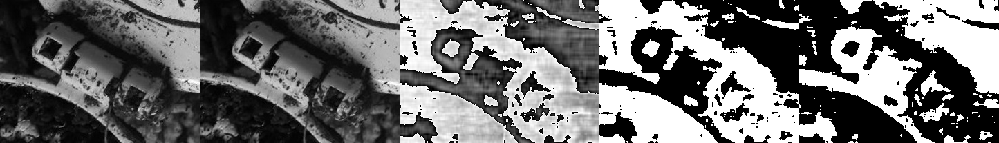




OCR result with GRAY transformation :  501P
OCR result with GRAY-PCA transformation :  50PI
OCR result with GRAY-PCA-THRESHOLD transformation :  50FI
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  50TE:


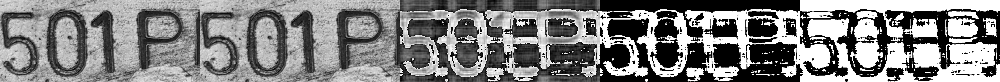




OCR result with GRAY transformation :  6
OCR result with GRAY-PCA transformation :  None
OCR result with GRAY-PCA-THRESHOLD transformation :  B
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  None


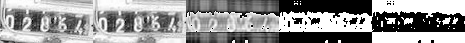




OCR result with GRAY transformation :  E
OCR result with GRAY-PCA transformation :  None
OCR result with GRAY-PCA-THRESHOLD transformation :  None
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  E


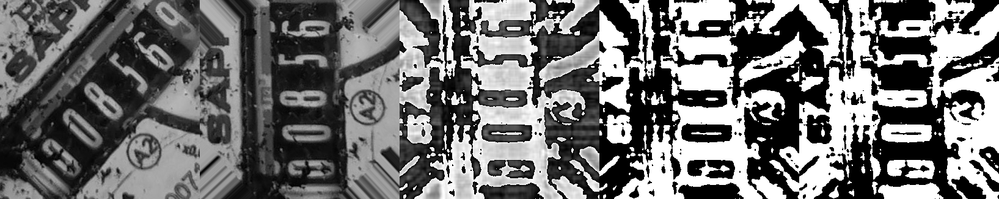




OCR result with GRAY transformation :  E
OCR result with GRAY-PCA transformation :  None
OCR result with GRAY-PCA-THRESHOLD transformation :  None
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  G


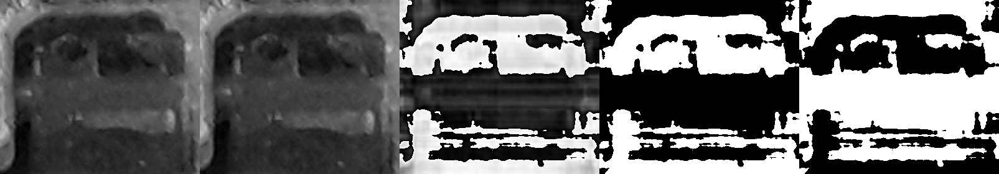




OCR result with GRAY transformation :  0203
OCR result with GRAY-PCA transformation :  None
OCR result with GRAY-PCA-THRESHOLD transformation :  None
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  None


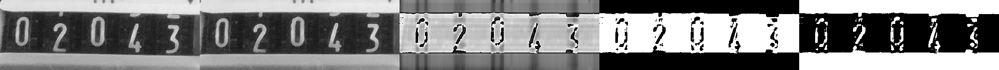




OCR result with GRAY transformation :  219.312
OCR result with GRAY-PCA transformation :  TanM
OCR result with GRAY-PCA-THRESHOLD transformation :  2
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  P


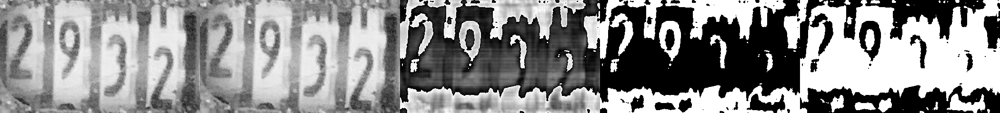




OCR result with GRAY transformation :  01058
OCR result with GRAY-PCA transformation :  C
OCR result with GRAY-PCA-THRESHOLD transformation :  Uta5
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  Ua


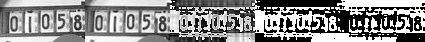




OCR result with GRAY transformation :  (00946
OCR result with GRAY-PCA transformation :  HT
OCR result with GRAY-PCA-THRESHOLD transformation :  T
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  ET:


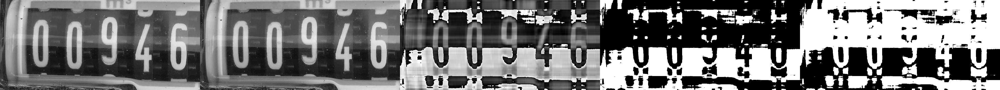




OCR result with GRAY transformation :  ni210
OCR result with GRAY-PCA transformation :  SR
OCR result with GRAY-PCA-THRESHOLD transformation :  None
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  P


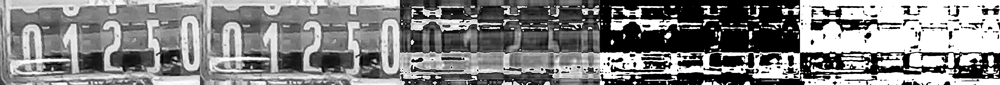




OCR result with GRAY transformation :  12.0271
OCR result with GRAY-PCA transformation :  4027
OCR result with GRAY-PCA-THRESHOLD transformation :  450273
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  760271


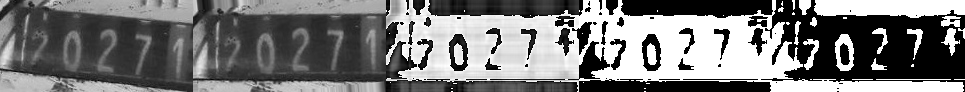




OCR result with GRAY transformation :  [200
OCR result with GRAY-PCA transformation :  B
OCR result with GRAY-PCA-THRESHOLD transformation :  B
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  L


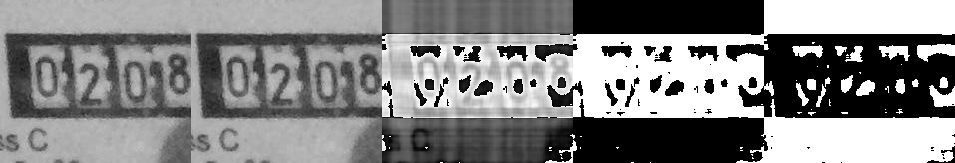




OCR result with GRAY transformation :  738
OCR result with GRAY-PCA transformation :  HA
OCR result with GRAY-PCA-THRESHOLD transformation :  H
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  None


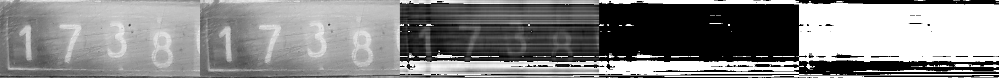




OCR result with GRAY transformation :  DOS
OCR result with GRAY-PCA transformation :  1
OCR result with GRAY-PCA-THRESHOLD transformation :  UaIS
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  UOFS


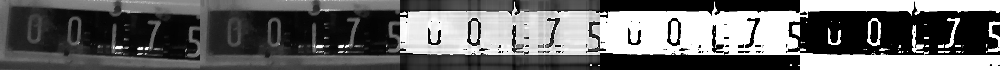




OCR result with GRAY transformation :  0
OCR result with GRAY-PCA transformation :  None
OCR result with GRAY-PCA-THRESHOLD transformation :  m0
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  None


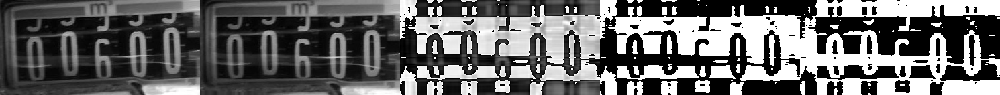




OCR result with GRAY transformation :  3054
OCR result with GRAY-PCA transformation :  NWKX
OCR result with GRAY-PCA-THRESHOLD transformation :  NKA
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  NM


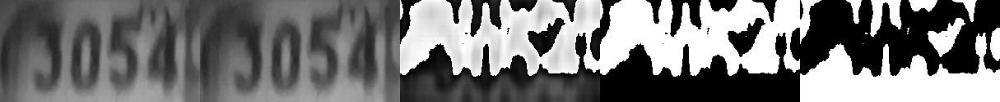




OCR result with GRAY transformation :  8
OCR result with GRAY-PCA transformation :  None
OCR result with GRAY-PCA-THRESHOLD transformation :  T7
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  T


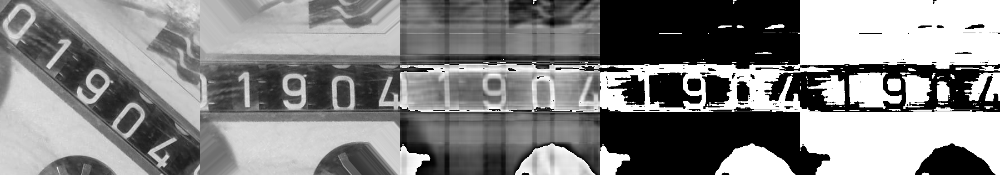




OCR result with GRAY transformation :  DIHIFIR
OCR result with GRAY-PCA transformation :  2-
OCR result with GRAY-PCA-THRESHOLD transformation :  -
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  n


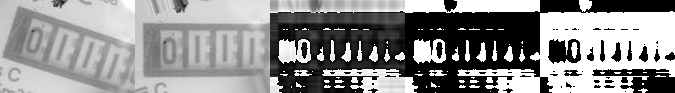




OCR result with GRAY transformation :  059
OCR result with GRAY-PCA transformation :  PEP
OCR result with GRAY-PCA-THRESHOLD transformation :  PRRE
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  PERREE


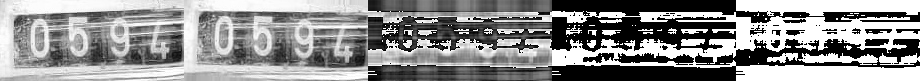




OCR result with GRAY transformation :  019
OCR result with GRAY-PCA transformation :  TFEAP
OCR result with GRAY-PCA-THRESHOLD transformation :  SFETA
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  ETA


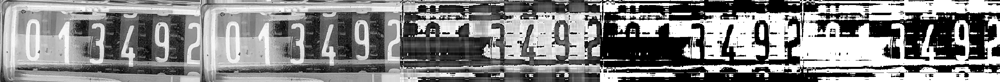




OCR result with GRAY transformation :  0208
OCR result with GRAY-PCA transformation :  O
OCR result with GRAY-PCA-THRESHOLD transformation :  O
OCR result with GRAY-PCA-THRESHOLD-BIN transformation :  07057


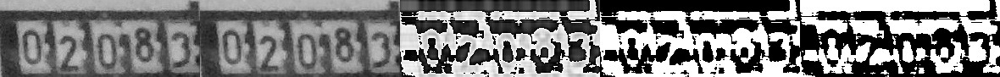

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

In [ ]:
out_dir = "/content/non_linear_pca/"
for each in os.listdir(folder_dir):
  curr_img = cv2.imread(os.path.join(folder_dir, each))
  gray_img = cv2.cvtColor(curr_img, cv2.COLOR_BGR2GRAY)
  h, w = gray_img.shape[:2]
  if h > w:
    gray_img = cv2.rotate(gray_img, cv2.cv2.ROTATE_90_CLOCKWISE)
  # print("gray shape : ", gray_img.shape, curr_img.shape)
  nonlinear_pca_pipeline(gray_img, out_dir)

ça se voit clairement qu'un PCA-cosine ne se montre pas comme une option pour le traitement de l'image.

Résultats: 

**Reconnaissance complète**:

Only skewed: 3

skewed + non_linear PCA: 0

skewed + non_linear PCA + THRESHOLD : 0

PCA + THRESHOLD + INV : 0

**Reconnaissance partial** (1 to total - 1 number recognized in good order):

Only skewed: 7

skewed + non_linear PCA: 2

skewed + non_linear PCA + THRESHOLD : 2

PCA + THRESHOLD + INV : 2

In [ ]:
import plotly.express as px
import pandas as pd
# for compelte recognition
data = [['skewed', "linear", 3, "fully"], ["sk+PCA", "linear", 3,"fully"], ["sk+PCA+TH", "linear",0,"fully"] , ["sk+PCA+TH+INV","linear",0,"fully"],
        ['skewed', "non-linear", 3,"fully"], ["sk+PCA", "non-linear", 0,"fully"], ["sk+PCA+TH", "non-linear",0,"fully"] , ["sk+PCA+TH+INV","non-linear",0,"fully"],
        ['skewed', "linear", 7, "partial"], ["sk+PCA", "linear", 8,"partial"], ["sk+PCA+TH", "linear",3,"partial"] , ["sk+PCA+TH+INV","linear",1,"partial"],
        ['skewed', "non-linear", 7,"partial"], ["sk+PCA", "non-linear", 2,"partial"], ["sk+PCA+TH", "non-linear",2,"partial"] , ["sk+PCA+TH+INV","non-linear",2,"partial"]]
 
# Create the pandas DataFrame
df = pd.DataFrame(data, columns=['transf', 'type-PCA', "number rec", "recog type"])

fig = px.bar(df, x="transf", y="number rec",
             color='type-PCA', barmode='group',
             height=400)
fig.show()

## RÉSULTATS

Les graphs ci-dessous montrent les résultats pour la **reconnaissance complète ("fully")**(gauche) et **reconnaissance partialle ("partial")** (droite)

In [ ]:
fig = px.bar(df, x="transf", y="number rec", color="type-PCA", barmode="group",
             facet_col="recog type",
             category_orders={"day": ["fully", "partial"],
                              })
fig.show()

OBS: Malgré la faible performance du modèle, ***rappellons nous que sans quelqu'une de ces transformations, PaddleOCR n'arrivait à reconnaître qu'une seule image*** (résultats dans le notebook précedent)

In [ ]:
import shutil

shutil.rmtree("/content/pca/")

# Appendice

Ci-dessous, les divers essais de processement d'image ⛹

Est-ce qu'appliquer plus d'une fois la même transformation aboutira à des résultats visibles?

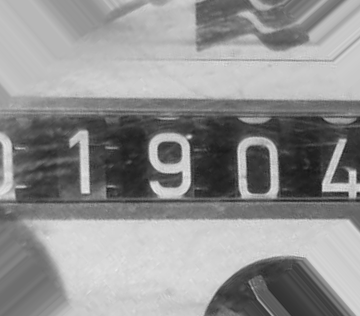

Right  : Thinning


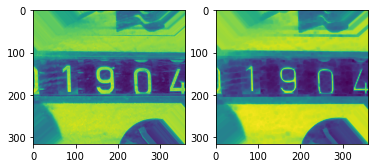

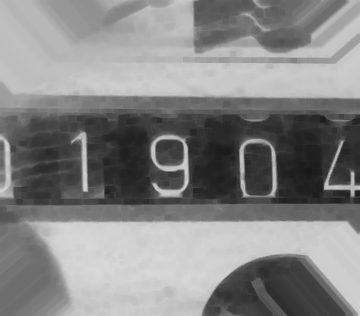

Right : Noise removed


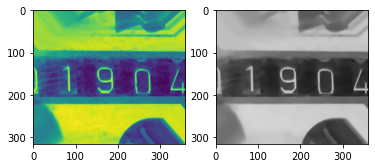

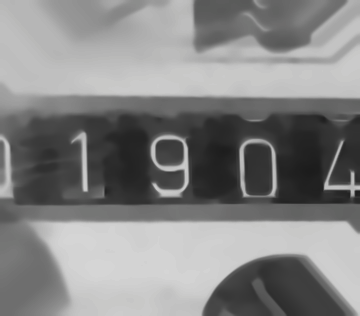

Binarized


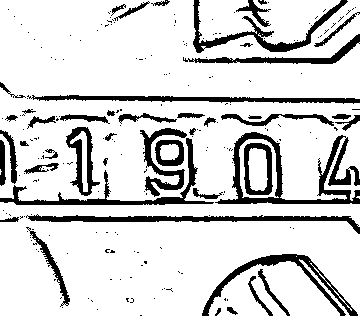

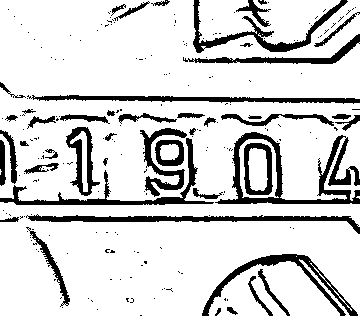

Binarized


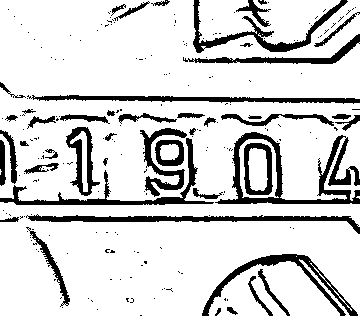

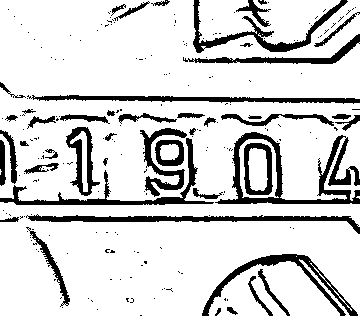

Right : Noise removed


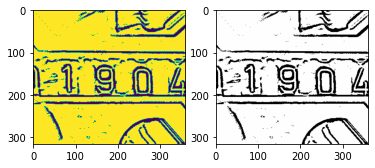

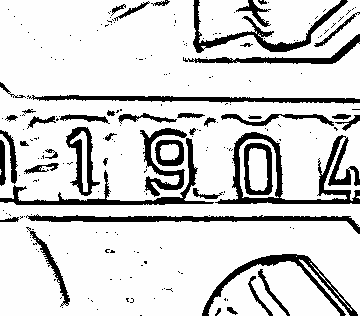

In [ ]:
current_img = skewed
# 1, 2, 0
cv2_imshow(current_img)
current_img = thinning(current_img)
cv2_imshow(current_img)
current_img = noise_removal(current_img)
cv2_imshow(current_img)
current_img = binarize(current_img)
cv2_imshow(current_img)
current_img = binarize(current_img)
cv2_imshow(current_img)

current_img = noise_removal(current_img)
cv2_imshow(current_img)

Dans ce cas au-dessus, pas vraiment. Il faudrait néanmoins essayer d'autres combinations.

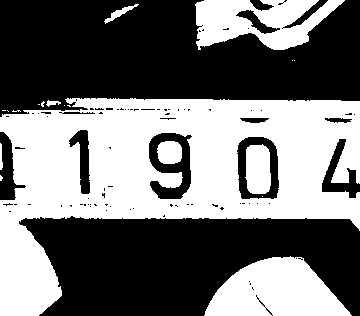

In [ ]:
thresh = cv2.threshold(skewed.copy(), 0, 255,
	cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
cv2_imshow(thresh)

L'image ci-dessu: application de coorection d'angle et de threshold.
Résultat d'OCR:

In [ ]:
test_img(thresh.copy(), None, None, "/content/")

result :  [('1', 0.4385533332824707)]
ocr result :  1
heigh and width :  316 360
Our filename :  /content/out_1.jpg


ci-après, transformation de distance et d'overture (détachement des objects)

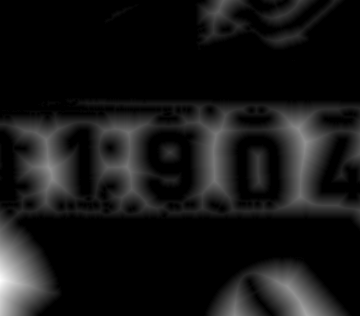

result :  [('XE002', 0.40548866987228394)]
ocr result :  XE002
heigh and width :  316 360
Our filename :  /content/out_XE002.jpg


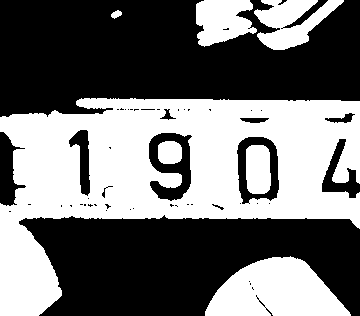

result :  [('1', 0.1908348649740219)]
ocr result :  1
heigh and width :  316 360
Our filename :  /content/out_1.jpg


In [ ]:
dist = cv2.distanceTransform(thresh.copy(), cv2.DIST_L2, 5)
# normalize the distance transform such that the distances lie in
# the range [0, 1] and then convert the distance transform back to
# an unsigned 8-bit integer in the range [0, 255]
dist = cv2.normalize(dist, dist, 0, 1.0, cv2.NORM_MINMAX)
dist = (dist * 255).astype("uint8")
# cv2_imshow()
cv2_imshow(dist)

test_img(dist.copy(), None, None, "/content/")

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
opening = cv2.morphologyEx(thresh.copy(), cv2.MORPH_OPEN, kernel)
cv2_imshow(opening)

test_img(opening.copy(), None, None, "/content/")
# threshold the distance transform using Otsu's method

# ITS NOT GOOD!!!
# dist = cv2.threshold(dist, 0, 255,
# 	cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
# cv2_imshow(dist)

# er = thinning(dist)
# cv2_imshow(er)

La première image, provenant d'une transformation de distance, aboutit à une reconnaissance (fausse) des plusieurs charactères!

# Prendre SEULEMENT les chiffres dans l'image!

Une bonne idée serait d'avoir seulement les chiffres dans l'image pour éviter de confondre l'OCR

In [ ]:
import imutils

"""
Get only the digits
"""
def get_countours(img):
  opening = img.copy()
  cnts = cv2.findContours(opening.copy(), cv2.RETR_EXTERNAL,
    cv2.CHAIN_APPROX_SIMPLE)
  cnts = imutils.grab_contours(cnts)
  chars = []
  # loop over the contours
  for c in cnts:
    # compute the bounding box of the contour
    (x, y, w, h) = cv2.boundingRect(c)
    # check if contour is at least 35px wide and 100px tall, and if
    # so, consider the contour a digit
    if w >= 5 and h >= 5:
      chars.append(c)
    
  chars = np.vstack([chars[i] for i in range(0, len(chars))])
  hull = cv2.convexHull(chars)
  # allocate memory for the convex hull mask, draw the convex hull on
  # the image, and then enlarge it via a dilation
  mask = np.zeros(opening.shape[:2], dtype="uint8")
  cv2.drawContours(mask, [hull], -1, 255, -1)
  mask = cv2.dilate(mask, None, iterations=2)
  # cv2_imshow(mask)
  # take the bitwise of the opening image and the mask to reveal *just*
  # the characters in the image
  final = cv2.bitwise_and(opening.copy(), opening.copy(), mask=mask)
  cv2_imshow(final)
  return final


final = get_countours(opening)
test_img(final.copy(), None, None, "/content/")

Voyons le résultat de la transformation Threshold

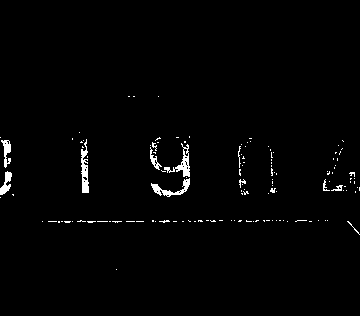

<class 'numpy.ndarray'>
result :  [('1.', 0.40468865633010864)]
ocr result :  1.
heigh and width :  316 360
Our filename :  /content/out_1..jpg


In [ ]:
# img = cv2.imread('pills.jpg')
hh, ww = img.shape[:2]

# threshold on white
# Define lower and uppper limits
lower = np.array([200, 200, 200])
upper = np.array([255, 255, 255])
# lower = np.array([00, 00, 00])
# upper = np.array([100, 100, 100])
a, sk = correct_skew(img.copy())
# Create mask to only select black
thresh = cv2.inRange(sk.copy(), lower, upper)
cv2_imshow(thresh)
print(type(thresh))
# apply morphology
# kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (20,20))
# morph = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)
# # cv2_imshow(morph)
# # invert morp image
# mask = 255 - morph

# # apply mask to image
# result = cv2.bitwise_and(img.copy(), img.copy(), mask=mask)

# cv2_imshow(result)
# i = noise_removal(thresh.copy())
# angle, e = correct_skew(i.copy())
# cv2_imshow(i)
test_img(thresh.copy(),None,None,"/content/")

Malgré la présence quasiment intégrale du nombre, OCR n'arrive pas à bien reconnaître. Peut-être due aux contours pas bien définis du nombre et à la présence de la ligne en-dessous.

Prennons les countours de l'image provenante de la transformations Threshold:

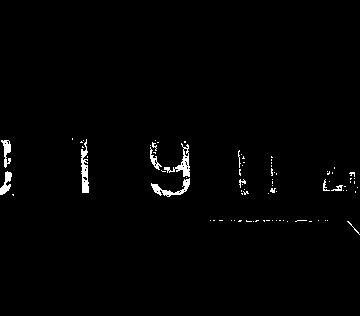

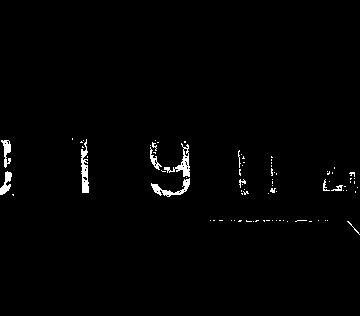

result :  [(':', 0.3333492875099182)]
ocr result :  :
heigh and width :  316 360
Our filename :  /content/out_:.jpg


In [ ]:
r = get_countours(thresh.copy())
cv2_imshow(r)
test_img(r.copy(),None,None,"/content/")

Malgré la disparition preque complète du background, les chiffres ne sont pas tout à fait visibles dans leur intégralité (une possible raison pour laquelle l'OCR ne les a pas reconnus). Nous avons perdue des informations importantes.

Essayons le contraire: les chiffres en noire et le background en blanc:

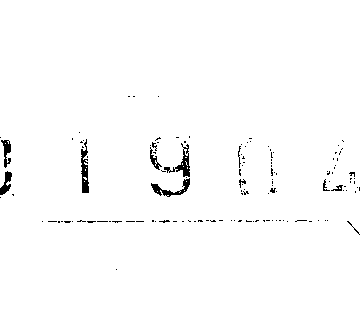

In [ ]:
# gray = cv2.cvtColor(skewed, cv2.COLOR_BGR2GRAY)
# threshold the image using Otsu's thresholding method
threshe = cv2.threshold(thresh.copy(), 0, 255,
	cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]

cv2_imshow(threshe)

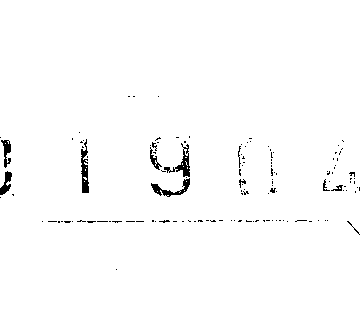

In [ ]:
kernel = np.ones((1,1),np.uint8)
augm = cv2.dilate(threshe.copy(), kernel, iterations=100)
cv2_imshow(augm)

In [ ]:
test_img(threshe.copy(),None,None, "/content/")

result :  [('1.5.1.', 0.609722912311554)]
ocr result :  1.5.1.
heigh and width :  316 360
Our filename :  /content/out_1.5.1..jpg


Pas encore bon! Probablement due à la presque disparition des traits composants les chiffres (ils sont très faibles)

Essayons de voir comment PaddleOCR lit une image téoriquement propre et bien démarquée:

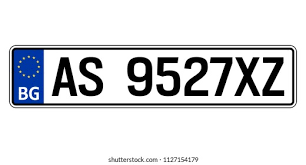

In [ ]:
car = cv2.imread("/content/car plate.png")
cv2_imshow(car)

In [ ]:
test_img(car,None,None,"/content/")

result :  [('BA5 9527N ', 0.5010005831718445)]
ocr result :  BA5 9527N 
heigh and width :  165 306
Our filename :  /content/out_BA5 9527N .jpg


Le résultat ci-dessus montre que malgré la qualité de l'image, PaddleOCR n'arrive pas à complètement reconnaître le texte dans son intégralité!

Bon... la tâche n'est pas évidente... ㊙ 😃

# Références

https://towardsdatascience.com/pre-processing-in-ocr-fc231c6035a7


https://medium.com/technovators/survey-on-image-preprocessing-techniques-to-improve-ocr-accuracy-616ddb931b76


https://pyimagesearch.com/2021/11/22/improving-ocr-results-with-basic-image-processing/

https://bhadreshpsavani.medium.com/how-to-use-tesseract-library-for-ocr-in-google-colab-notebook-5da5470e4fe0

https://pyimagesearch.com/2021/08/30/detecting-and-ocring-digits-with-tesseract-and-python/

https://pyimagesearch.com/2021/09/06/whitelisting-and-blacklisting-characters-with-tesseract-and-python/